In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json

import seaborn as sns

plt.rcParams['figure.figsize'] = (10, 10)
sc.settings.set_figure_params(dpi=100, facecolor='white')

In [2]:
adata = sc.read("../../../data/schiller_whl_anno.h5ad")
adata

AnnData object with n_obs × n_vars = 24071 × 23400
    obs: 'Unnamed: 0', 'nGene', 'nUMI', 'orig.ident', 'identifier', 'res.2', 'grouping', 'cell.type', 'metacelltype', 'spline_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'doublet_score', 'predicted_doublet', 'is_doublet', 'leiden_0.7', 'leiden', 'leiden_1.3', 'author_annotation', 'batch', 'condition', 'timepoint', 'leiden_0.5', 'manual_celltype_annotation', 'author_annotation_coarse'
    var: 'gene_name', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell.type_colors', 'grouping_col

In [3]:
manual_annotation_05 = {
    "0": "Myofibroblasts",
    "1": "Myofibroblasts",
    "2": "Dendritic",
    "3": "AT2",
    "4": "undefined",
    "5": "AT1",
    "6": "Endothelial",
    "7": "AT2",
    "8": "Alveolar fibroblast", #?
    "9": "Dendritic",
    "10": "AT1",
    "11": "Neutrophils"
}

In [4]:
f = open('marker_genes.json')
marker_genes = json.load(f)
f.close()

In [5]:
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


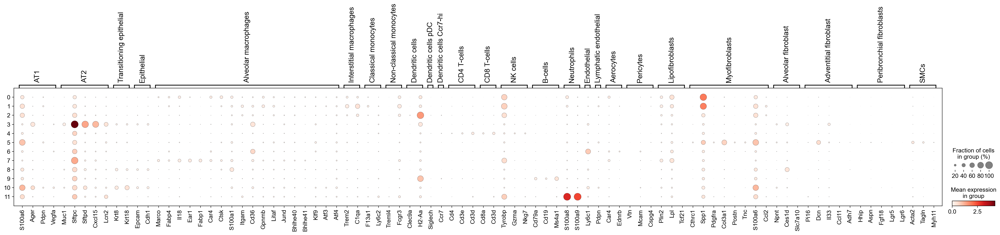

In [6]:
sc.pl.dotplot(adata, marker_genes_in_data, groupby=['leiden_0.5'])

In [7]:
alveolar_macrophages = ["Fabp4",
"Apoe",
"Msr1",
"Serping1",
"Mcemp1",
"Trem1",
"Gpnmb",
"Cyp27a1",
"Pparg",
"Nupr1"]

In [8]:
interstitial_macrophages = ["F13a1", "Rnase1", "Stab1", "Rnase6", "Gpr183", "Fgl2", "Csf1r", "Fcgr2b", "Il13ra1", "Metrnl"]

In [9]:
[g for g in alveolar_macrophages if g in (adata.var.index)]

['Fabp4',
 'Apoe',
 'Msr1',
 'Serping1',
 'Trem1',
 'Gpnmb',
 'Cyp27a1',
 'Pparg',
 'Nupr1']

/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


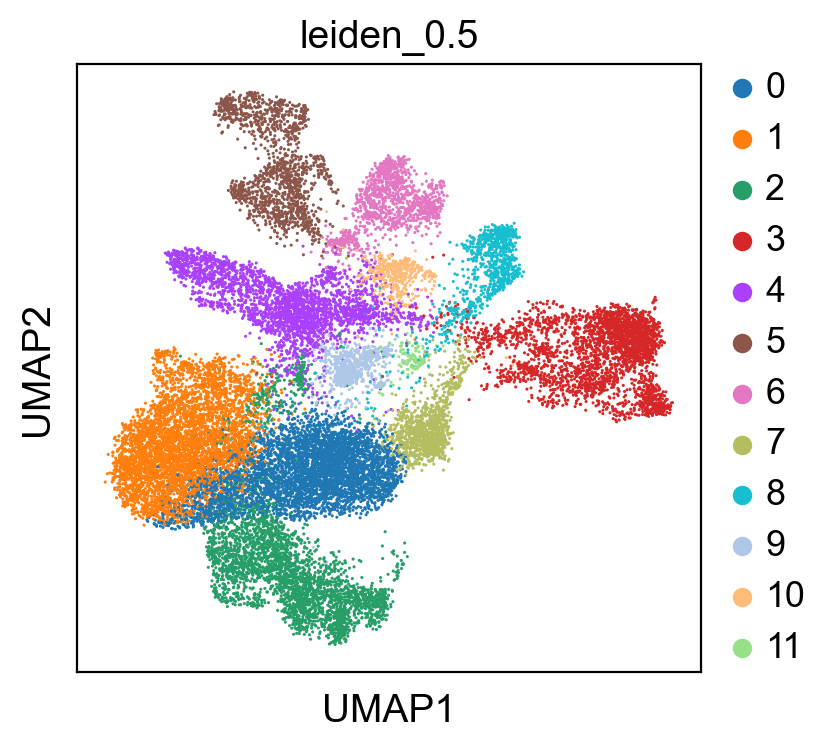

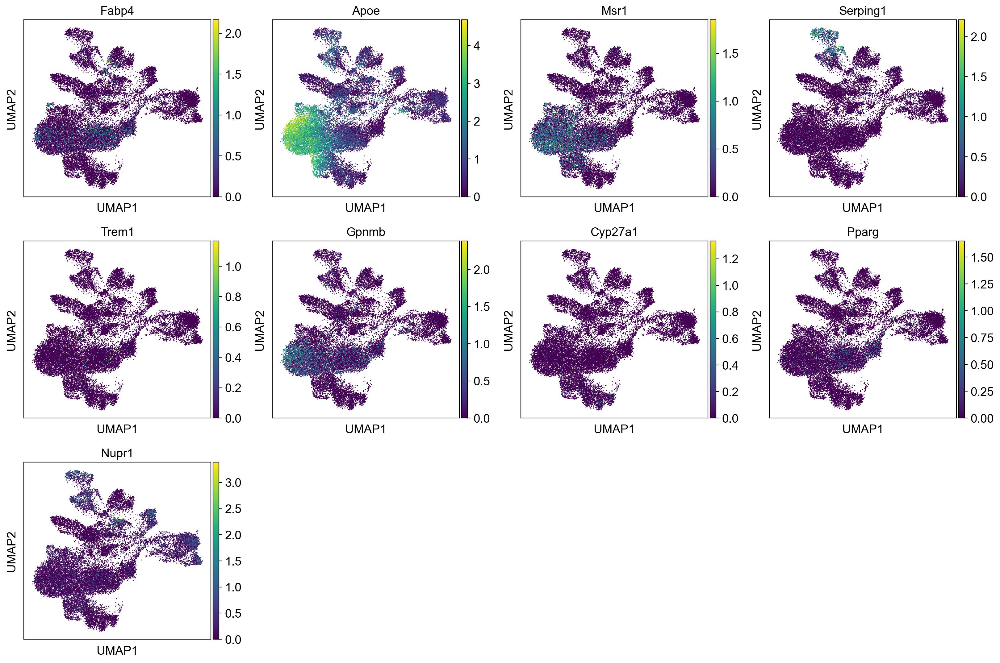

In [10]:
sc.pl.umap(adata, color=["leiden_0.5"])
sc.pl.umap(adata, color=[g for g in alveolar_macrophages if g in (adata.var.index)])

/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


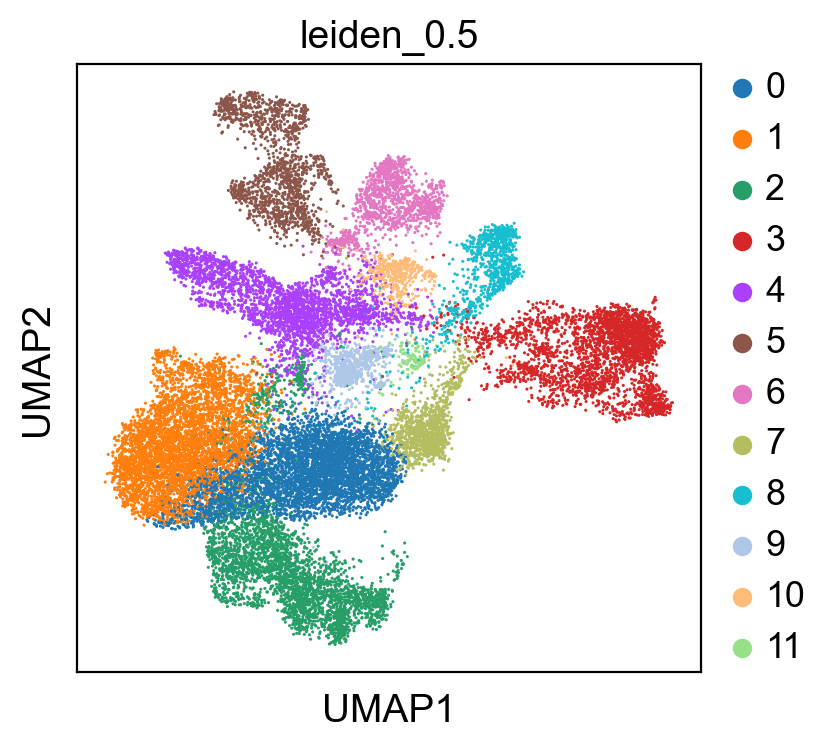

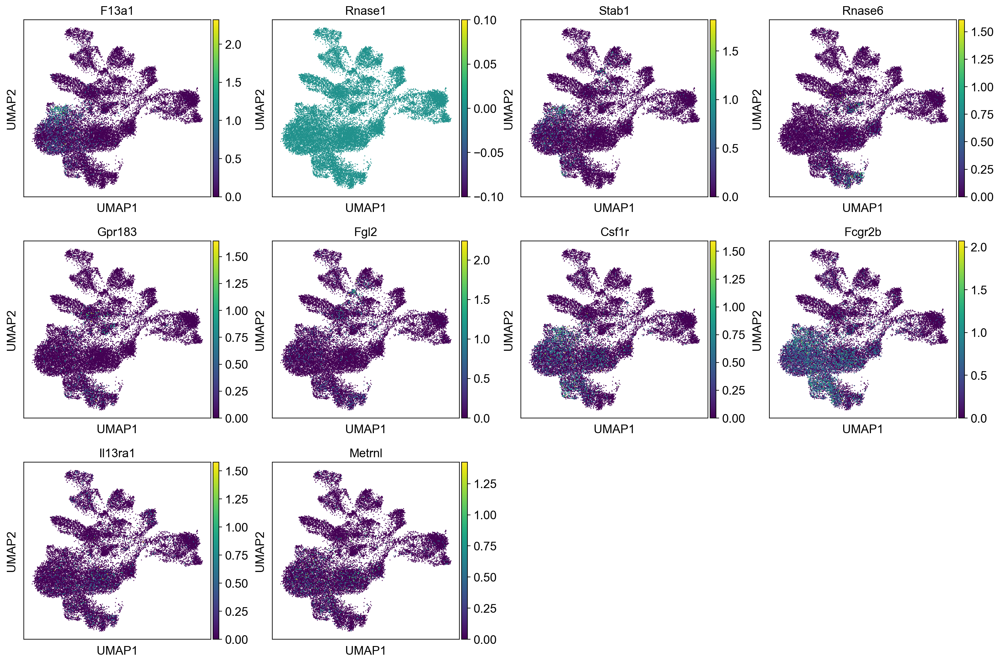

In [11]:
sc.pl.umap(adata, color=["leiden_0.5"])
sc.pl.umap(adata, color=[g for g in interstitial_macrophages if g in (adata.var.index)])

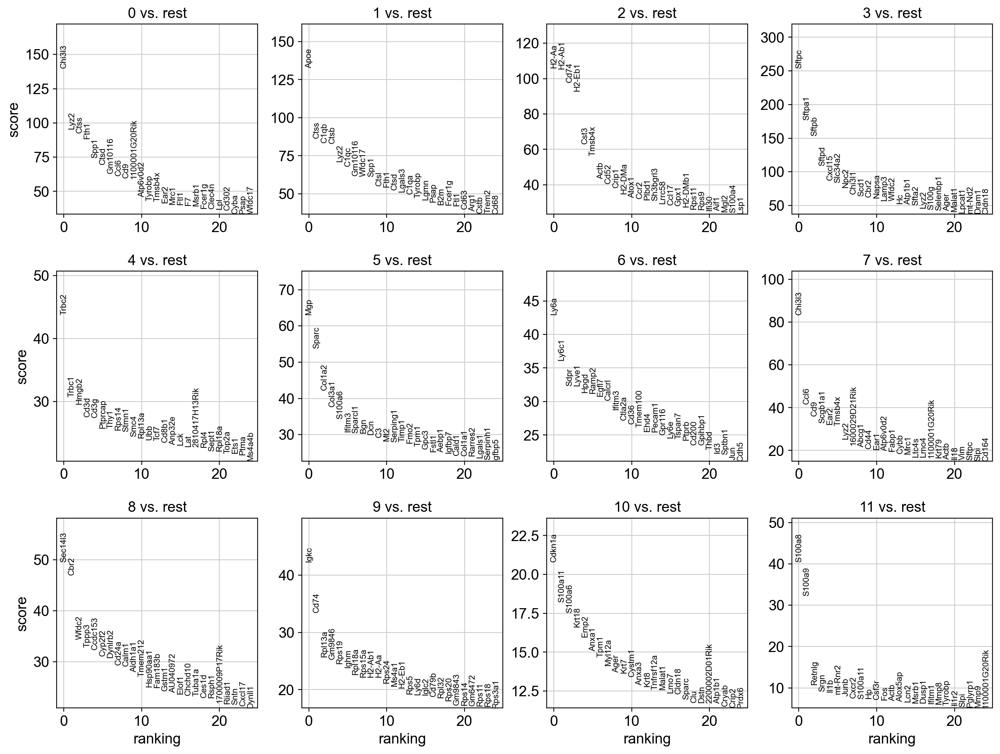

In [12]:
sc.tl.rank_genes_groups(adata, 'leiden_0.5', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [13]:
adata

AnnData object with n_obs × n_vars = 24071 × 23400
    obs: 'Unnamed: 0', 'nGene', 'nUMI', 'orig.ident', 'identifier', 'res.2', 'grouping', 'cell.type', 'metacelltype', 'spline_cluster', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'doublet_score', 'predicted_doublet', 'is_doublet', 'leiden_0.7', 'leiden', 'leiden_1.3', 'author_annotation', 'batch', 'condition', 'timepoint', 'leiden_0.5', 'manual_celltype_annotation', 'author_annotation_coarse'
    var: 'gene_name', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell.type_colors', 'grouping_col

In [14]:
cd4_tcells = ["Il32", "Cd3e", "Cd3d", "Cd2", "Ltb", "Acap1", "Trac", "Trbc2", "Cd4"]

/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


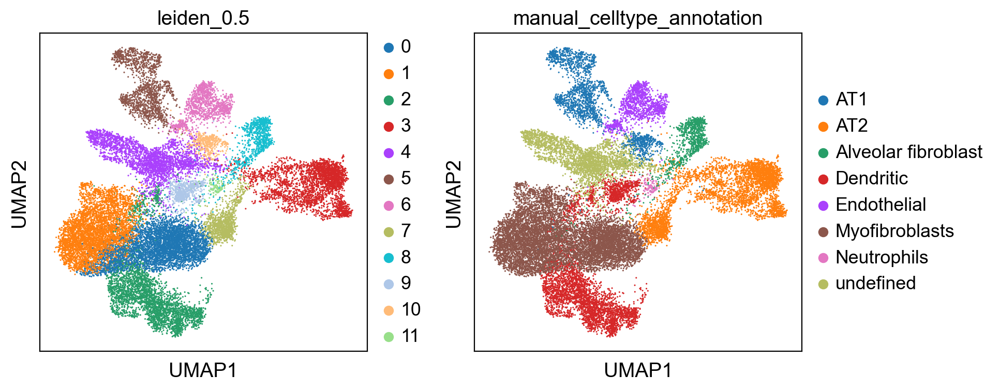

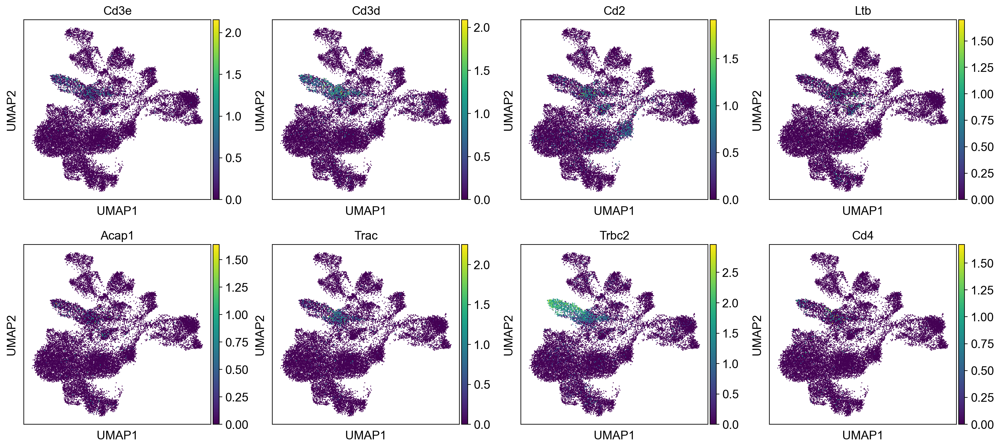

In [15]:
sc.pl.umap(adata, color=["leiden_0.5", "manual_celltype_annotation"])
sc.pl.umap(adata, color=[g for g in cd4_tcells if g in (adata.var.index)])

In [16]:
alveolar_fibroblasts = ["Npnt", "Ces1d", "Slc7a10"]

/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


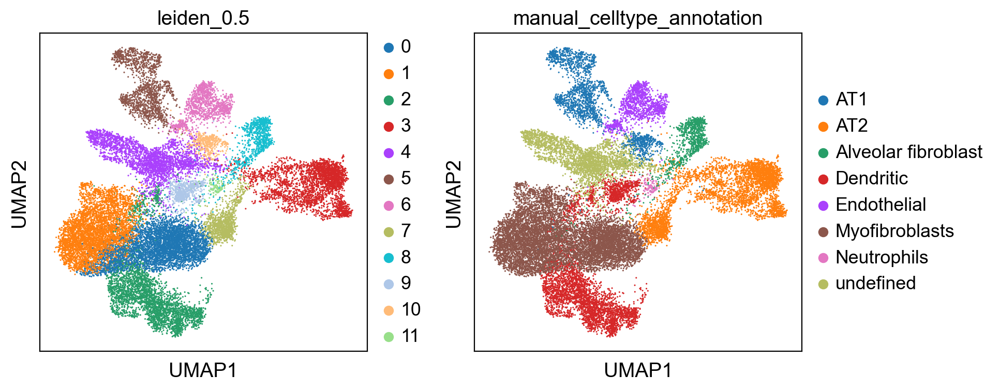

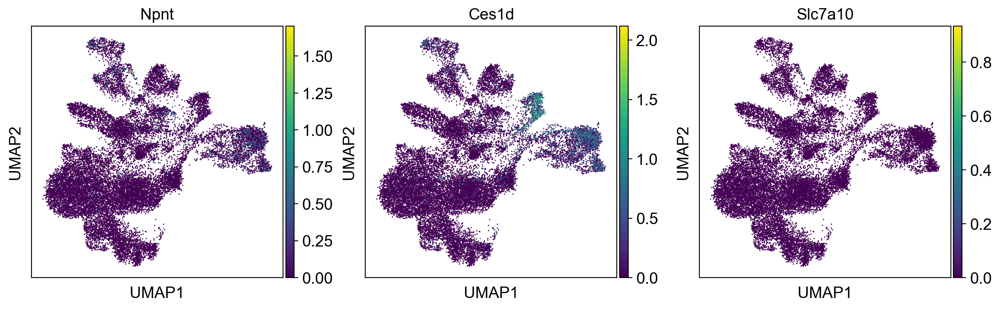

In [17]:
sc.pl.umap(adata, color=["leiden_0.5", "manual_celltype_annotation"])
sc.pl.umap(adata, color=[g for g in alveolar_fibroblasts if g in (adata.var.index)])

In [21]:
adata.obs["manual_celltype_annotation"] = adata.obs["manual_celltype_annotation"].cat.rename_categories({"Myofibroblasts": "Macrophages", "undefined": "T-cells" })

/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/d/danilina/mambaforge/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


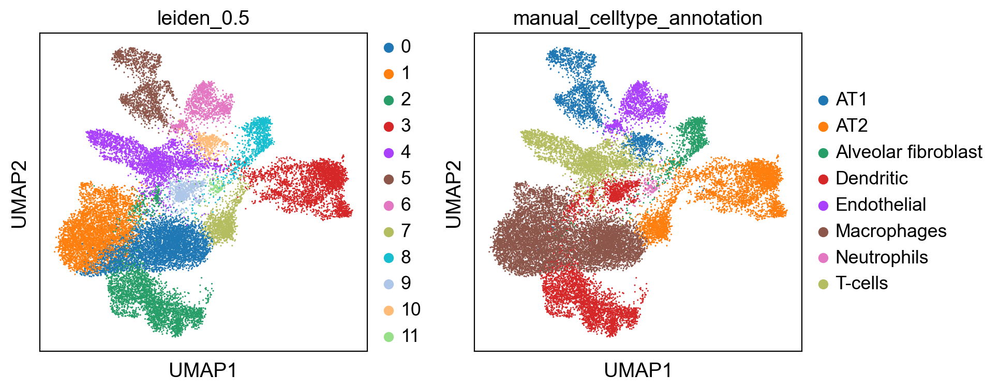

In [22]:
sc.pl.umap(adata, color=["leiden_0.5", "manual_celltype_annotation"])


In [23]:
adata.write("../../../data/schiller_whl_anno.h5ad")